In [1]:
import os
import numpy as np
import torch

In [2]:
from torch.utils.data import DataLoader
from generate_data import generate_vrp_data
from utils import load_model
from problems import CVRP,CVRP_BUS

In [3]:
%matplotlib inline
from matplotlib import pyplot as plt

from matplotlib.collections import PatchCollection
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D

# Code inspired by Google OR Tools plot:
# https://github.com/google/or-tools/blob/fb12c5ded7423d524fc6c95656a9bdc290a81d4d/examples/python/cvrptw_plot.py

def discrete_cmap(N, base_cmap=None):
  """
    Create an N-bin discrete colormap from the specified input map
    """
  # Note that if base_cmap is a string or None, you can simply do
  #    return plt.cm.get_cmap(base_cmap, N)
  # The following works for string, None, or a colormap instance:

  base = plt.cm.get_cmap(base_cmap)
  color_list = base(np.linspace(0, 1, N))
  cmap_name = base.name + str(N)
  return base.from_list(cmap_name, color_list, N)

def plot_vehicle_routes(data, route, ax1, markersize=5, visualize_demands=False, demand_scale=1, round_demand=False, scale=True):
    """
    Plot the vehicle routes on matplotlib axis ax1.
    """
    
    # route is one sequence, separating different routes with 0 (depot)

    routes = [r[r!=0] for r in np.split(route.cpu().numpy(), np.where(route==0)[0]) if (r != 0).any()]
    depot = data['depot'].cpu().numpy()
    locs = data['loc'].cpu().numpy()
    if scale :
        demands = data['demand'].cpu().numpy() * demand_scale
    else :
        demands = data['demand'].cpu().numpy()
        # print(demands)
        
    capacity = demand_scale # Capacity is always 1
    
    

    x_dep, y_dep = depot
    ax1.plot(x_dep, y_dep, 'sk', markersize=markersize*4)
    ax1.set_xlim(0, 1)
    ax1.set_ylim(0, 1)
    
    
    cmap = discrete_cmap(len(routes) + 2, 'nipy_spectral')
    dem_rects = []
    used_rects = []
    cap_rects = []
    qvs = []
    total_dist = 0
    for veh_number, r in enumerate(routes):
        color = cmap(len(routes) - veh_number) # Invert to have in rainbow order
        # print(r-1)
        route_demands = demands[r - 1]
        coords = locs[r - 1, :]
        xs, ys = coords.transpose()

        total_route_demand = sum(route_demands)
        assert int(total_route_demand) <= int(capacity)
        if not visualize_demands:
            ax1.plot(xs, ys, 'o', mfc=color, markersize=markersize, markeredgewidth=0.0)
        
        dist = 0
        x_prev, y_prev = x_dep, y_dep
        cum_demand = 0
        for (x, y), d in zip(coords, route_demands):
            dist += np.sqrt((x - x_prev) ** 2 + (y - y_prev) ** 2)
            
            cap_rects.append(Rectangle((x, y), 0.01, 0.1))
            used_rects.append(Rectangle((x, y), 0.01, 0.1 * total_route_demand / capacity))
            dem_rects.append(Rectangle((x, y + 0.1 * cum_demand / capacity), 0.01, 0.1 * d / capacity))
            
            x_prev, y_prev = x, y
            cum_demand += d
            
        dist += np.sqrt((x_dep - x_prev) ** 2 + (y_dep - y_prev) ** 2)
        total_dist += dist
        qv = ax1.quiver(
            xs[:-1],
            ys[:-1],
            xs[1:] - xs[:-1],
            ys[1:] - ys[:-1],
            scale_units='xy',
            angles='xy',
            scale=1,
            color=color,
            label='R{}, # {}, c {} / {}, d {:.2f}'.format(
                veh_number, 
                len(r), 
                int(total_route_demand) if round_demand else total_route_demand, 
                int(capacity) if round_demand else capacity,
                dist
            )
        )
        
        qvs.append(qv)
    
    overall_cost = 0.2*len(routes)+0.8*total_dist
    ax1.set_title('{} routes, total distance {:.2f}, overall cost {:.3f}'.format(len(routes), total_dist,overall_cost))
    
    legend = ax1.legend(loc='upper center')

    ax1.legend(handles=qvs)
    
    pc_cap = PatchCollection(cap_rects, facecolor='whitesmoke', alpha=1.0, edgecolor='lightgray')
    pc_used = PatchCollection(used_rects, facecolor='lightgray', alpha=1.0, edgecolor='lightgray')
    pc_dem = PatchCollection(dem_rects, facecolor='black', alpha=1.0, edgecolor='black')
    
    if visualize_demands:
        ax1.add_collection(pc_cap)
        ax1.add_collection(pc_used)
        ax1.add_collection(pc_dem)

    return overall_cost,total_dist,len(routes)

In [4]:
# dataset = CVRP_BUS.make_dataset(size=20, num_samples=20)
dataset = CVRP_BUS.make_dataset(size=20, num_samples=10000,filename='data/cvrp_bus/cvrp_bus20_validation_seed1234.pkl')
print(len(dataset))



[{'loc': tensor([[0.6071, 0.5763],
        [0.0757, 0.6161],
        [0.9398, 0.9034],
        [0.2919, 0.1638],
        [0.9164, 0.2619],
        [0.3460, 0.7980],
        [0.6217, 0.1168],
        [0.9125, 0.6753],
        [0.1932, 0.7452],
        [0.0391, 0.0904],
        [0.7811, 0.6825],
        [0.1098, 0.3782],
        [0.7616, 0.9230],
        [0.3322, 0.5929],
        [0.4040, 0.0248],
        [0.3684, 0.3490],
        [0.5730, 0.3560],
        [0.6037, 0.8676],
        [0.0487, 0.9022],
        [0.4691, 0.9519]]), 'demand': tensor([0.3556, 0.1778, 0.2222, 0.2222, 0.2667, 0.2222, 0.2000, 0.2444, 0.2222,
        0.1556, 0.2667, 0.2444, 0.1111, 0.1556, 0.1111, 0.1333, 0.3778, 0.1333,
        0.1333, 0.0444]), 'depot': tensor([0.2646, 0.1159])}, {'loc': tensor([[0.0678, 0.4716],
        [0.8265, 0.4156],
        [0.7607, 0.2545],
        [0.7036, 0.8730],
        [0.0833, 0.8314],
        [0.2997, 0.2737],
        [0.3706, 0.5594],
        [0.0587, 0.0853],
        [0.7000, 0.41

In [5]:

# model, _ = load_model('outputs/cvrp_bus_20/cvrp_bus_20_rollout_20221127T110707')
# model, _ = load_model('outputs/cvrp_bus_20/cvrp_bus_20_rollout_20221129T123036/epoch-99.pt')
model, _ = load_model('team23_model/epoch-99.pt')
model2, _ = load_model('pretrained/cvrp_20')
torch.manual_seed(1234)

  [*] Loading model from team23_model/epoch-99.pt
  [*] Loading model from pretrained/cvrp_20/epoch-99.pt


In [6]:
# np.random.seed(320)

# Need a dataloader to batch instances
dataloader = DataLoader(dataset, batch_size=10000)

# Make var works for dicts
batch = next(iter(dataloader))

# Run the model
model.eval()
model.set_decode_type('greedy')
with torch.no_grad():
    length, log_p, pi = model(batch, return_pi=True)
tours = pi

model2.eval()
model2.set_decode_type('greedy')
with torch.no_grad():
    length2, log_p2, pi2 = model2(batch, return_pi=True)
tours2 = pi2


/tmp/ipykernel_852582/2631622406.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig1, (ax1,ax2) = plt.subplots(1,2,figsize=(10,5))


our model win(num_buses) 2128 times among 10000) cases
our model lose(num_buses) 431 times among 10000 cases
our model win(dist) 4649 times among 10000 cases
our model lose(dist) 4944 times among 10000 cases
our model win(overall_cost) 5005 times among 10000 cases
our model lose(overall_caost) 4581 times among 10000 cases
model1 mean // cost 6.66197860441488 // dist 7.228748255518615 // num_buses 4.3949
model2 mean // cost 6.688142011983109 // dist 7.218927514978871 // num_buses 4.565


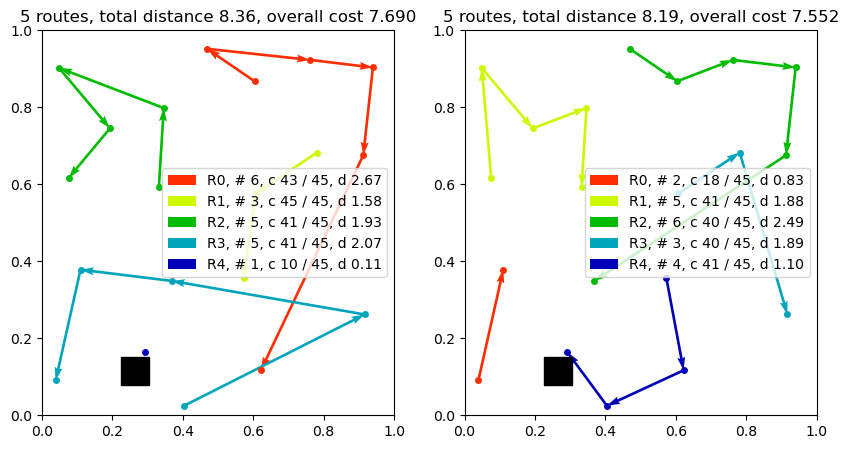

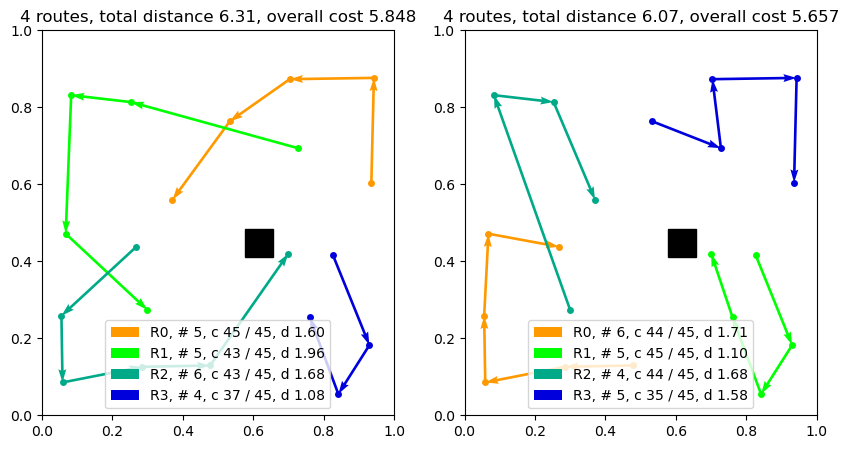

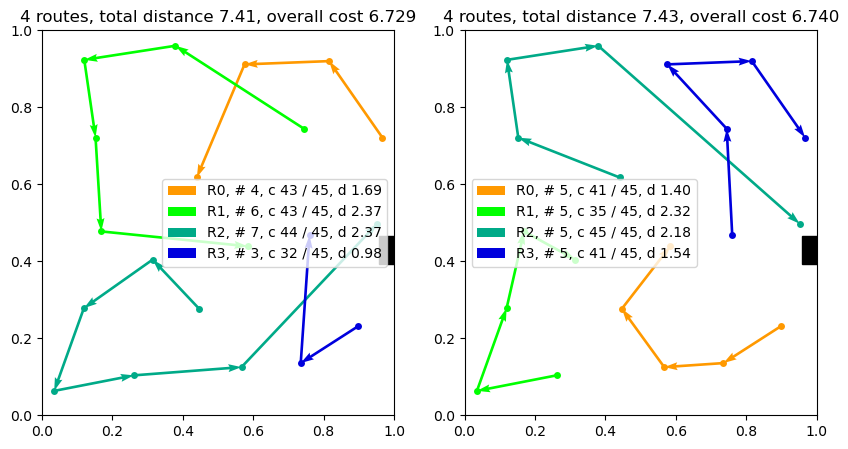

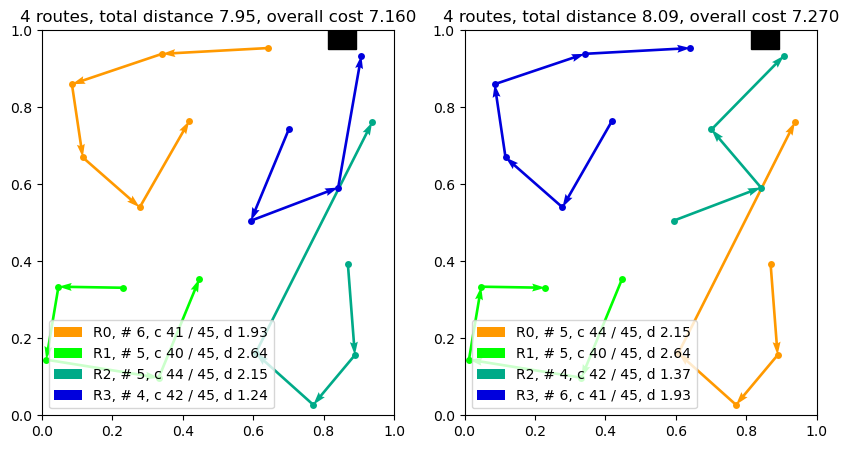

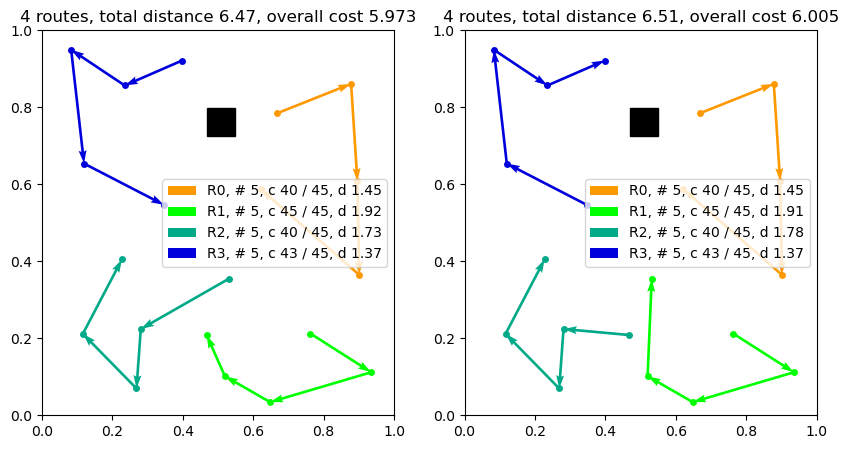

...

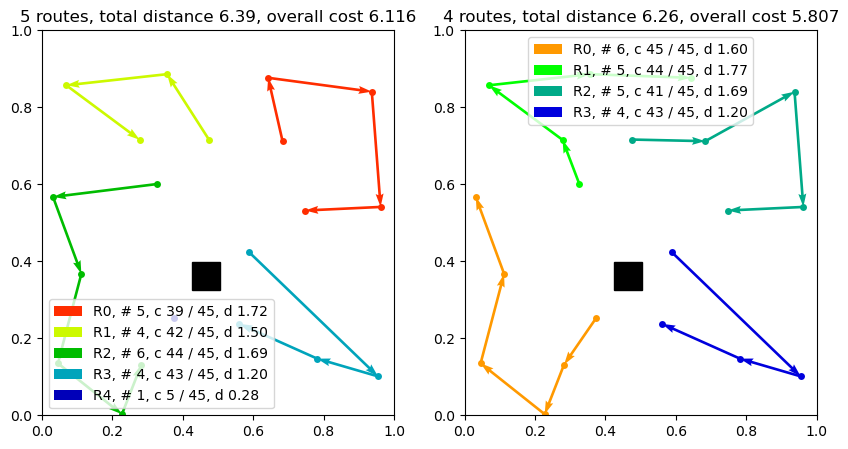

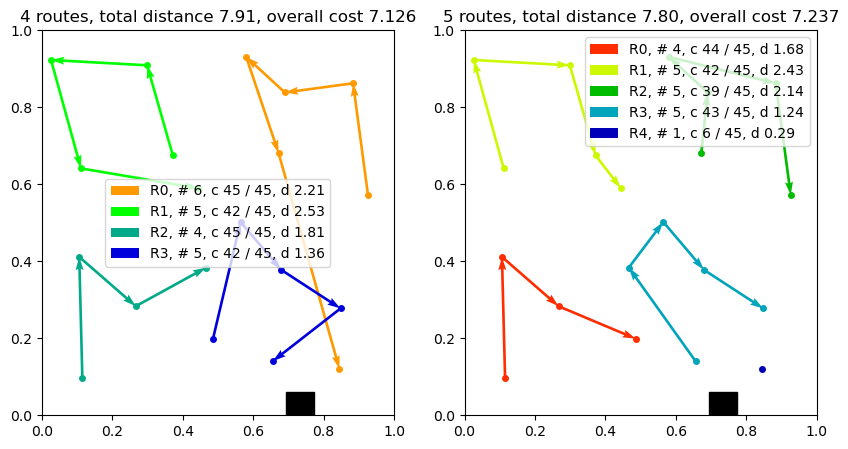

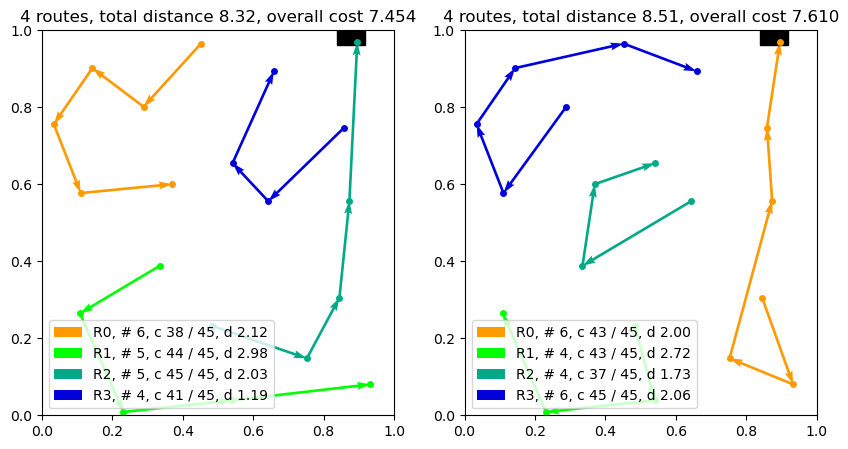

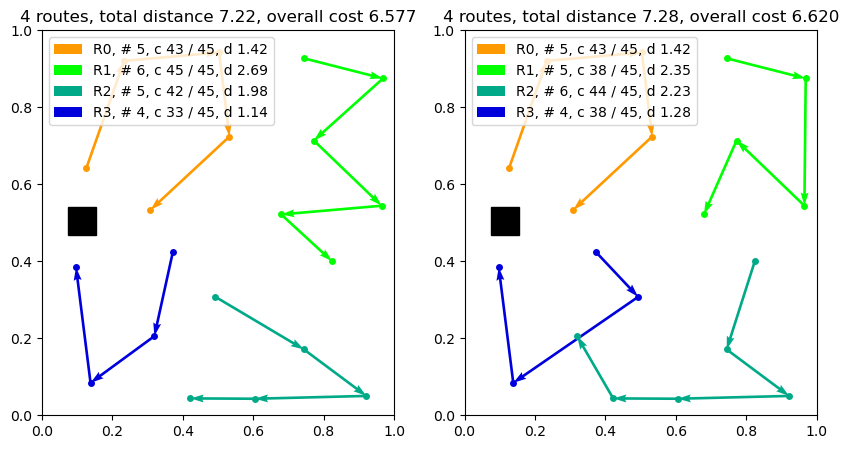

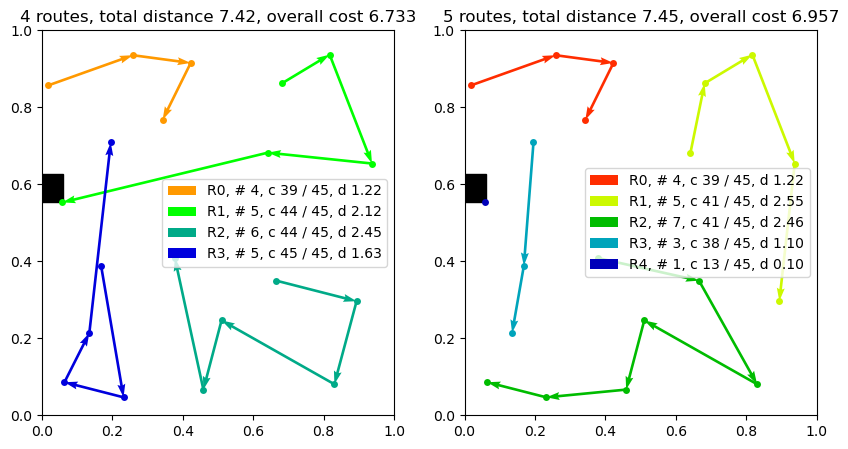

In [7]:
# You can modify n_val to reduce the evaluation dataset size.

n_val=10000

win=0
lose=0
cost_win=0
cost_lose=0
dist_win=0
dist_lose=0

sum_buses1=0
sum_buses2=0
dist_sum1=0
dist_sum2=0
cost_sum1=0
cost_sum2=0


for i in range(n_val):
    # fig1, ax1 = plt.subplots(figsize=(5,5))
    fig1, (ax1,ax2) = plt.subplots(1,2,figsize=(10,5))
    cost1,total_dist1, n_bus1 = plot_vehicle_routes(dataset[i], tours[i], ax1, visualize_demands=False, demand_scale=45, round_demand=True, scale=True)
    cost2,total_dist2,n_bus2 = plot_vehicle_routes(dataset[i], tours2[i], ax2, visualize_demands=False, demand_scale=45, round_demand=True, scale= True)
    if n_bus1<n_bus2:
        win+=1
    elif n_bus1>n_bus2:
        lose+=1

    if total_dist1<total_dist2:
        dist_win+=1
    elif total_dist1>total_dist2:
        dist_lose+=1

    if cost1<cost2:
        cost_win+=1
    elif cost1>cost2:
        cost_lose+=1
    
    sum_buses1+=n_bus1
    sum_buses2+=n_bus2
    dist_sum1+=total_dist1
    dist_sum2+=total_dist2
    cost_sum1+=cost1
    cost_sum2+=cost2

    #only show 31 cases as picture
    if (i>30):
        plt.close()

print(f'our model win(num_buses) {win} times among {n_val}) cases')
print(f'our model lose(num_buses) {lose} times among {n_val} cases')
print(f'our model win(dist) {dist_win} times among {n_val} cases')
print(f'our model lose(dist) {dist_lose} times among {n_val} cases')
print(f'our model win(overall_cost) {cost_win} times among {n_val} cases')
print(f'our model lose(overall_caost) {cost_lose} times among {n_val} cases')

print(f'model1 mean // cost {cost_sum1/n_val} // dist {dist_sum1/n_val} // num_buses {sum_buses1/n_val}')
print(f'model2 mean // cost {cost_sum2/n_val} // dist {dist_sum2/n_val} // num_buses {sum_buses2/n_val}')